# One-Dimensional Climate Models: The Basics of Brown Dwarfs

In this tutorial you will learn the very basics of running 1D climate runs. For a more in depth look at the climate code check out [Mukherjee et al. 2022](https://ui.adsabs.harvard.edu/abs/2022arXiv220807836M/abstract) (note this should also be cited if using this code/tutorial).

What you should already be familiar with:

- [basics of running/analyzing thermal spectra](https://natashabatalha.github.io/picaso/tutorials.html#basics-of-thermal-emission)
- [how to analyze thermal emission spectra](https://natashabatalha.github.io/picaso/notebooks/workshops/ERS2021/ThermalEmissionTutorial.html)

What you will need to download to use this tutorial:

1. [Download](https://doi.org/10.5281/zenodo.18636725) New 1460 PT, 196 wno Correlated-k Tables to be used by the climate code for opacity
2. [Download](https://zenodo.org/record/5063476/files/structures_m%2B0.0.tar.gz?download=1) the sonora bobcat cloud free `structures_` file so that you can validate your model run


You can use the `data.get_data` helper function to get these files and add them to the default picaso location: `reference/opaities/preweighted` for the opacities and `reference/sonora/bobcat` for the structure files
 >> import picaso.data as d

 >>d.get_data(category_download='ck_tables',target_download='by-molecule')

  >>d.get_data(category_download='sonora_grids',target_download='bobcat')


In [1]:
import os
import warnings
warnings.filterwarnings('ignore')
import picaso.justdoit as jdi
import picaso.justplotit as jpi
jpi.output_notebook()
import astropy.units as u
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

Loading BokehJS ...

## What does a climate model solve for?

1D Radiative-Convective Equilibrium Models solve for atmospheric structures of brown dwarfs and exoplanets, which includes:

1\. The Temperature Structure (T(P) profile)

2\. The Chemical Structure

3\. Energy Transport in the atmosphere

But these physical components are not independent of each other. For example, the chemistry is dependent on the T(P) profile, the radiative transfer is dependent on clouds and the chemistry and so on.

`PICASO` tries to find the atmospheric state of your object by taking care of all of these processes and their interconnections self-consistently and iteratively. Therefore, you will find that the climate portion of `PICASO` is slower than running a single forward model evaluation.

## Starting up the Run

You will notice that starting a run is nearly identical as running a spectrum. However, how we will add `climate=True` to our inputs flag. We will also specify `browndwarf` in this case, which will turn off the irradiation the object is receiving.

New Parameter: **Effective Temperature**. This excerpt from [Modeling Exoplanetary Atmospheres (Fortney et al)](https://arxiv.org/pdf/1804.08149.pdf) provides a thorough description and more reading, if you are interested.

>If the effective temperature, $T_{eff}$, is defined as the temperature of a blackbody of
the same radius that would emit the equivalent flux as the real planet, $T_{eff}$ and $T_{eq}$
can be simply related. This relation requires the inclusion of a third temperature,
$T_{int}$, the intrinsic effective temperature, that describes the flux from the planet’s
interior. These temperatures are related by:"

>$T_{eff}^4 =  T_{int}^4 + T_{eq}^4$

>We then recover our limiting cases: if a planet is self-luminous (like a young giant
planet) and far from its parent star, $T_{eff} \approx  T_{int}$; for most rocky planets, or any
planets under extreme stellar irradiation, $T_{eff} \approx T_{eq}$.

In [2]:
cl_run = jdi.inputs(calculation="browndwarf", climate = True) # start a calculation

#note you need to put the climate keyword to be True in order to do so
# now you need to add these parameters to your calculation

teff= 1000 # Effective Temperature of your Brown Dwarf in K
grav = 1000 # Gravity of your brown dwarf in m/s/s

cl_run.gravity(gravity=grav, gravity_unit=u.Unit('m/(s**2)')) # input gravity
cl_run.effective_temp(teff) # input effective temperature

Let's now grab our gaseous opacities, whose path we have already defined above. Again, this code uses a correlated-k approach for accurately capturing opacities (see [section 2.1.4; Mukerjee et al 2022](https://ui.adsabs.harvard.edu/abs/2022arXiv220807836M/abstract)).

In [3]:
mh = '0.0'#'+0.0' #log metallicity
CtoO = '0.46'# # CtoO absolute ratio
ck_db = os.path.join(os.getenv('picaso_refdata'),'opacities', 'preweighted', f'sonora_2121grid_feh{mh}_co{CtoO}.hdf5')

sonora_profile_db = os.path.join(os.getenv('picaso_refdata'),'sonora_grids','bobcat')

# and not the line by line opacities
opacity_ck = jdi.opannection(ck_db=ck_db,method='preweighted') # grab your opacities

## Initial T(P)  Guess

Every calculation requires an initial guess of the pressure temperature profile. The code will iterate from there to find the correct solution. A few tips:

1. We recommend **using typically 51-91 atmospheric pressure levels**. Too many pressure layers increases the computational time required for convergence. Too little layers makes the atmospheric grid too coarse for an accurate calculation.

2. Start with **a guess that is close to your expected solution**. We will show an example using an isothermal P(T) profile below so you can see the iterative process. Later though, we recommend leveraging pre-computed grids (e.g. Sonora) as a starting guess for Brown Dwarfs.


In [4]:
nlevel = 91 # number of plane-parallel levels in your code

#Lets set the max and min at 1e-4 bars and 500 bars

Pmin = 1e-4 #bars
Pmax = 500 #bars
pressure=np.logspace(np.log10(Pmin),np.log10(Pmax),nlevel) # set your pressure grid

temp_guess = np.zeros(shape=(nlevel)) + 500 # K , isothermal atmosphere guess

## Initial Convective Zone Guess

You also need to have a crude guess of the convective zone of your atmosphere. Generally the deeper atmosphere is always convective. Again a good guess is always the published SONORA grid of models for this. But lets assume that the bottom 7 levels of the atmosphere is convective.

**New Parameters:**

1. `rcb_guess` : this defines the top most level of your guessed convective zone. If you don't have a clue where your convective zone might end be choose a number that is $\sim$nlevel-5 (a few pressure levels away from the very bottom of your grid)
2. `rfacv`: (See [Mukherjee et al. 2022](https://ui.adsabs.harvard.edu/abs/2022arXiv220807836M/abstract) Eqn. 20 `r_st`)

Non-zero values of rst (aka "rfacv" legacy terminology) is only relevant when the external irradiation on the atmosphere is non-zero. In the scenario when a user is computing a planet-wide average T(P) profile, the stellar irradiation is contributing to 50% (one hemisphere) of the planet and as a result rst = 0.5. If instead the goal is to compute a night-side average atmospheric state, rst is set to be 0. On the other extreme, to compute the day-side atmospheric state of a tidally locked planet rst should be set at 1.

In [5]:
rcb_guess = 83 # top most level of guessed convective zone

# Here are some other parameters needed for the code.
rfacv = 0.0 #we are focused on a brown dwarf so let's keep this as is

Now we would use the inputs_climate function to input everything together to our cl_run we started.

In [6]:
cl_run.inputs_climate(temp_guess=temp_guess, pressure=pressure,
                      rcb_guess=rcb_guess, rfacv=rfacv)

## Run the Climate Code

 The actual climate code can be run with the cl_run.run command. The save_all_profiles is set to True to save the T(P) profile at all steps. The code will now iterate from your guess to reach the correct atmospheric solution for your brown dwarf of interest.



In [7]:
out = cl_run.climate(opacity_ck, save_all_profiles=True, with_spec=True)

SUMMARY
-------
Clouds: False
quench False
cold_trap False
vol_rainout False
no_ph3 False
Moist Adiabat: False


Iteration number  0 , min , max temp  499.99508734722053 755.7936042052085 , flux balance  -0.9375966241599653
Iteration number  1 , min , max temp  499.7500696998766 2253.789523831924 , flux balance  -0.40889410646241126
Iteration number  2 , min , max temp  489.2588906215532 2261.370376053108 , flux balance  -0.34377662620661903


Iteration number  3 , min , max temp  451.51168565837895 2286.4570201908077 , flux balance  -0.18315189007015686
Iteration number  4 , min , max temp  361.6724361487461 2326.479775577726 , flux balance  0.017413405784438247
Iteration number  5 , min , max temp  307.05402495806743 2326.365191540718 , flux balance  0.000620507959920397
Iteration number  6 , min , max temp  281.292683516889 2326.3566032587773 , flux balance  1.088709029936636e-05
 We are already at a root, tolf , test =  5e-05 ,  1.088709029936636e-05
Big iteration is  281.292683516889 0
 We are already at a root, tolf , test =  5e-05 ,  1.088709029936636e-05
Profile converged before itmx


Iteration number  0 , min , max temp  281.9709768903707 2367.9195033605524 , flux balance  -0.8020972511622549
Iteration number  1 , min , max temp  289.70747853945903 2791.3086661805896 , flux balance  -0.7026576086311627
Iteration number  2 , min , max temp  301.46380719551865 3074.436669440686 , flux balance  -0.54495760935547
Iteration number  3 , min , max temp  347.0460237367567 3777.901057928991 , flux balance  0.37881637689837366
Iteration number  4 , min , max temp  339.92736623437963 3601.1392215278256 , flux balance  0.04398767518028171
Iteration number  5 , min , max temp  339.0450899718079 3579.4099580319266 , flux balance  0.0010162580662482572
Iteration number  6 , min , max temp  339.02340500424657 3579.080474734581 , flux balance  5.825395165448139e-06
In t_start: Converged Solution in iterations  6


Big iteration is  339.02340500424657 0
 We are already at a root, tolf , test =  5e-05 ,  5.9571256616459735e-06
Profile converged before itmx


Iteration number  0 , min , max temp  339.2277312103834 3580.982471569272 , flux balance  -0.1826756738895391
Iteration number  1 , min , max temp  357.50701505798304 5199.9 , flux balance  0.01994044212087767
Iteration number  2 , min , max temp  356.20607477900586 5199.9 , flux balance  0.0003409288249537789


Iteration number  3 , min , max temp  356.17769466572514 5199.9 , flux balance  1.8372508960128376e-06
Iteration number  4 , min , max temp  356.177295138651 5199.9 , flux balance  9.628572716678379e-09
In t_start: Converged Solution in iterations  4
Big iteration is  356.177295138651 0


Iteration number  0 , min , max temp  356.17729431484025 5199.9 , flux balance  8.230968684971145e-09
In t_start: Converged Solution in iterations  0
Profile converged before itmx
Move up two levels


Iteration number  0 , min , max temp  356.46648100542615 4985.210872044676 , flux balance  -0.023075657201468727
Iteration number  1 , min , max temp  359.5305175086609 5199.9 , flux balance  0.0006392030703558702
Iteration number  2 , min , max temp  359.52793233901883 5199.9 , flux balance  3.908530571895317e-06
Iteration number  3 , min , max temp  359.5279035936346 5199.9 , flux balance  1.3249508096395926e-08
In t_start: Converged Solution in iterations  3
Big iteration is  359.5279035936346 0
 We are already at a root, tolf , test =  5e-05 ,  7.199823648951424e-06
Profile converged before itmx
Move up two levels


Iteration number  0 , min , max temp  359.72226608362695 4396.9310429170755 , flux balance  -0.004383331233936429
Iteration number  1 , min , max temp  360.00185331206336 4475.77471666165 , flux balance  2.163235042251096e-05
Iteration number  2 , min , max temp  360.00532214699103 4473.914342165091 , flux balance  4.77886058055379e-08
In t_start: Converged Solution in iterations  2
Big iteration is  360.00532214699103 0
 We are already at a root, tolf , test =  5e-05 ,  1.271082480227316e-05
Profile converged before itmx
Move up two levels


Iteration number  0 , min , max temp  360.0858151460886 3788.201535339441 , flux balance  1.1044501674735275e-05
Iteration number  1 , min , max temp  360.08688498442325 3787.3536998899704 , flux balance  1.926496626260931e-08
In t_start: Converged Solution in iterations  1
Big iteration is  360.08688498442325 0
 We are already at a root, tolf , test =  5e-05 ,  7.208663061565315e-06
Profile converged before itmx
Move up two levels


Iteration number  0 , min , max temp  360.31388547979225 3503.5019386893287 , flux balance  3.773424446113313e-05
Iteration number  1 , min , max temp  360.31666629528536 3503.361206824385 , flux balance  1.4844655807644913e-07
In t_start: Converged Solution in iterations  1
Big iteration is  360.31666629528536 0
 We are already at a root, tolf , test =  5e-05 ,  2.981472006338223e-06
Profile converged before itmx


Iteration number  0 , min , max temp  360.5301922907444 3488.936358395769 , flux balance  -1.4103879398301315e-06
In t_start: Converged Solution in iterations  0
Big iteration is  360.5301922907444 0


Iteration number  0 , min , max temp  360.5332625756938 3488.9118510093613 , flux balance  1.267310243950238e-08
In t_start: Converged Solution in iterations  0
Profile converged before itmx
final [0, 73, 89, 0, 0, 0]


Iteration number  0 , min , max temp  360.6304080205554 3490.908230527152 , flux balance  -9.741066913480494e-06
In t_start: Converged Solution in iterations  0
Big iteration is  360.6304080205554 0
 We are already at a root, tolf , test =  5e-05 ,  2.630389636664353e-05
Profile converged before itmx
YAY ! ENDING WITH CONVERGENCE


## `xarray` model storage


In [8]:
preserve_clima = jdi.output_xarray(out, cl_run)

In [9]:
preserve_clima

<xarray.Dataset> Size: 75kB
Dimensions:         (pressure: 91, pressure_layer: 90, wavelength: 196)
Coordinates:
  * pressure        (pressure) float64 728B 0.0001 0.0001187 ... 421.2 500.0
  * pressure_layer  (pressure_layer) float64 720B 0.0001089 0.0001293 ... 458.9
  * wavelength      (wavelength) float64 2kB 227.5 138.8 97.75 ... 0.287 0.2679
Data variables: (12/98)
    temperature     (pressure) float64 728B 360.6 362.8 ... 3.377e+03 3.491e+03
    dtdp            (pressure_layer) float64 720B 0.03481 0.0203 ... 0.1932
    guess 1         (pressure) float64 728B 500.0 500.0 500.0 ... 500.0 500.0
    guess 2         (pressure) float64 728B 500.0 500.0 500.0 ... 679.1 714.5
    guess 3         (pressure) float64 728B 500.0 500.0 500.0 ... 679.1 714.5
    guess 4         (pressure) float64 728B 500.0 500.0 500.0 ... 718.4 755.8
    ...              ...
    Mg+             (pressure) float64 728B 1e-50 1e-50 ... 2.303e-09 4.047e-09
    Si              (pressure) float64 728B 1e-50 1e-50 ... 3.495e-06 4.424e-06
    Fe+             (pressure) float64 728B 1e-50 1e-50 ... 6.177e-10 1.117e-09
    Ti              (pressure) float64 728B 1e-50 1e-50 ... 1.075e-07 1.141e-07
    Ti+             (pressure) float64 728B 1e-50 1e-50 ... 6.988e-11 1.2e-10
    C+              (pressure) float64 728B 1e-50 1e-50 ... 1.875e-19 9.565e-19
Attributes:
    climate_params:  {"cvs_locs": [0, 73, 89, 0, 0, 0], "converged": 1}
    planet_params:   {"effective_temp": 999.8672769938453, "gravity": {"value...

## Benchmark with Sonora Bobcat

Text(0.5, 1.0, 'T$_{\\rm eff}$= 1000 K, log(g)=5.0')

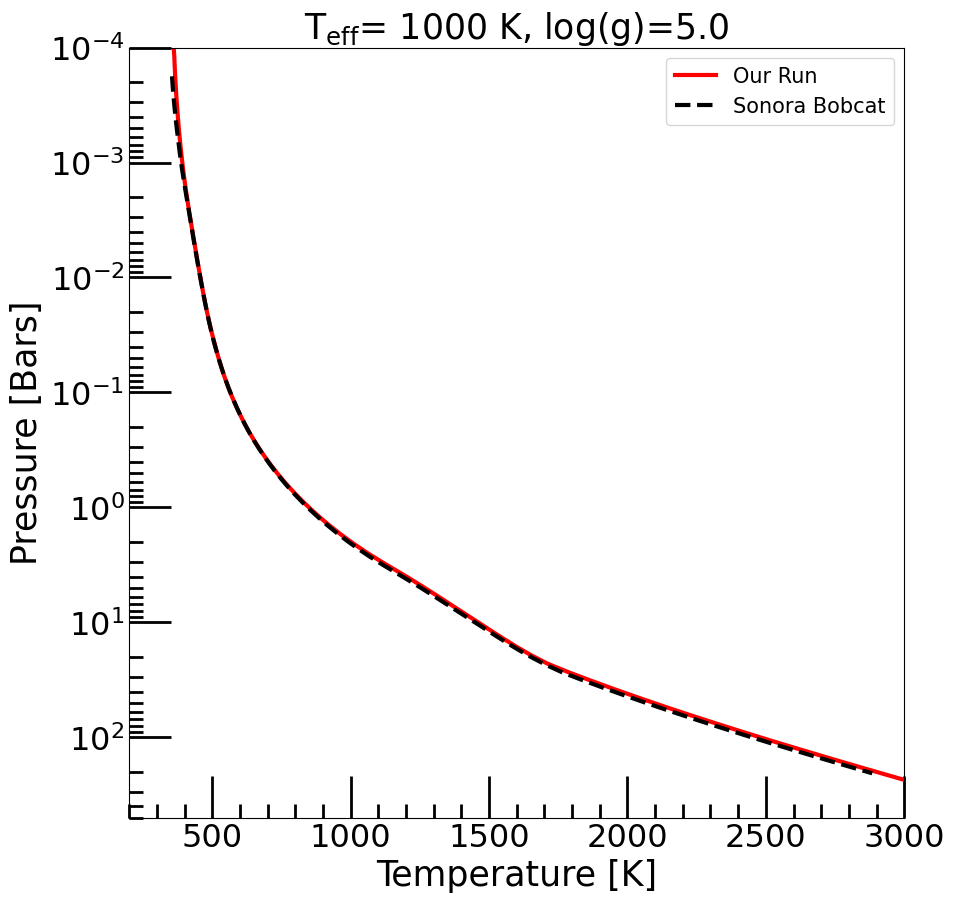

In [10]:
pressure_bobcat,temp_bobcat = np.loadtxt(jdi.os.path.join(
                            sonora_profile_db,f"t{teff}g{grav}nc_m0.0.cmp.gz"),
                            usecols=[1,2],unpack=True, skiprows = 1)

plt.figure(figsize=(10,10))
plt.ylabel("Pressure [Bars]", fontsize=25)
plt.xlabel('Temperature [K]', fontsize=25)
plt.ylim(500,1e-4)
plt.xlim(200,3000)

plt.semilogy(out['temperature'],out['pressure'],color="r",linewidth=3,label="Our Run")

plt.semilogy(temp_bobcat,pressure_bobcat,color="k",linestyle="--",linewidth=3,label="Sonora Bobcat")


plt.minorticks_on()
plt.tick_params(axis='both',which='major',length =30, width=2,direction='in',labelsize=23)
plt.tick_params(axis='both',which='minor',length =10, width=2,direction='in',labelsize=23)

plt.legend(fontsize=15)

plt.title(r"T$_{\rm eff}$= 1000 K, log(g)=5.0",fontsize=25)



## Climate Plots and Animations

### Animate Convergence

We can also try to see how our initial guess of an isothermal atmosphere was changed by the code to reach the converged solution

In [11]:
import importlib;importlib.reload(jpi)

<module 'picaso.justplotit' from '/home/nbatalh1/codes/picaso/picaso/justplotit.py'>

In [12]:
ani = jpi.animate_convergence(out, cl_run, opacity_ck,
    molecules=['H2O','CH4','CO','NH3'])

In [13]:
ani

### Brightness Temperature

Checking the brightness temperature serves many useful purposes:

1. Intuition building. Allows you to see what corresponding temperature are you sensitive to at each wavelength

Note that this temperature doesn't need to be the physical temperature of your atmosphere but if you can find the physical converged atmospheric temperature closest to this brightness temperature you can also get an idea of the atmospheric pressure from where the flux you are seeing is originating from.

2. Determining if your choice in bottom boundary pressure grid was correct.

If your brightness temperature is such that you bottom out at the temperature corresponding to the highest pressure, you have not extended your grid to high enough pressures.

Brightness Temperature Equation:

$T_{\rm bright}=\dfrac{a}{{\lambda}log\left(\dfrac{{b}}{F(\lambda){\lambda}^5}+1\right)}$

where a = 1.43877735x$10^{-2}$ m.K and b = 11.91042952x$10^{-17}$ m$^4$kg/s$^3$

Let's calculate the brightness temperature of our current run and check if our pressure grid was okay.

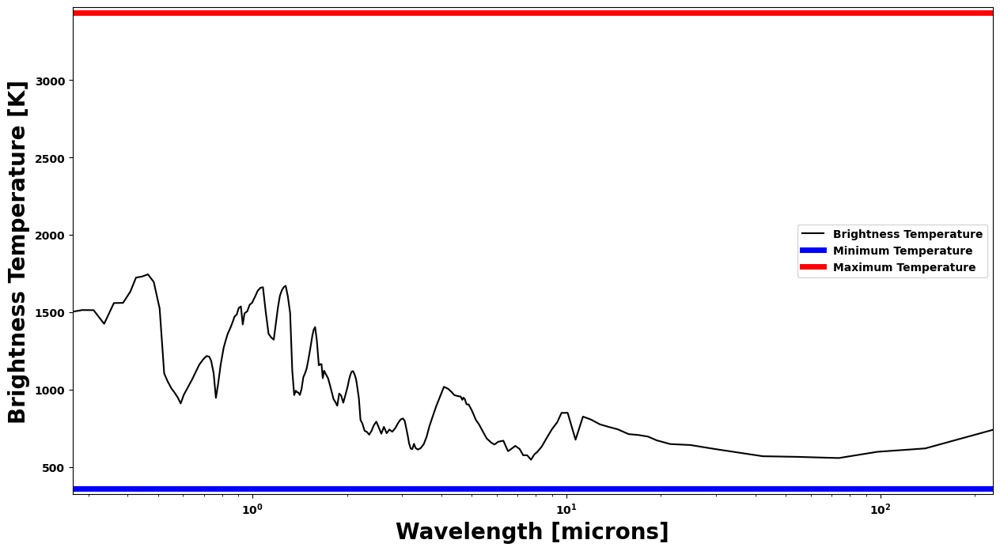

In [14]:
brightness_temp, figure= jpi.brightness_temperature(out['spectrum_output'])

In the above plot you can see that your brightness temperature is nicely bound between the minimum and maximum temperature. Your run is good and your choice of pressure grid is also great. Well done team!


## Selecting an Adequate Pressure Grid

For understanding and intuition building, let's do out a run where we purposely choose an incomplete pressure grid. Let's do the same run by the max pressure set at only 3 bars instead of 500 bars.

In [15]:
cl_bad_pres = jdi.inputs(calculation="brown", climate = True)
cl_bad_pres.gravity(gravity=grav, gravity_unit=u.Unit('m/(s**2)')) # input gravity
cl_bad_pres.effective_temp(teff)

nlevel = 91 # number of plane-parallel levels in your code
Pmin = 1e-4 #bars
Pmax = 3 #bars
pressure=np.logspace(np.log10(Pmin),np.log10(Pmax),nlevel) # set your pressure grid

temp_guess = np.zeros(shape=(nlevel)) + 500 # K , isothermal atmosphere guess

rcb_guess = 83 # top most level of guessed convective zone

rfacv = 0.0 #we are focused on a brown dwarf so let's keep this as is

cl_bad_pres.inputs_climate(temp_guess= temp_guess, pressure= pressure,
                      rcb_guess=rcb_guess, rfacv = rfacv)
out_bad_pres = cl_bad_pres.climate(opacity_ck, save_all_profiles=True,with_spec=True)

SUMMARY
-------
Clouds: False
quench False
cold_trap False
vol_rainout False
no_ph3 False
Moist Adiabat: False


Iteration number  0 , min , max temp  499.11937057112516 660.0446389059825 , flux balance  -0.892344410401542
Iteration number  1 , min , max temp  491.81227569326353 843.7835300804433 , flux balance  -0.7556141472242216
Iteration number  2 , min , max temp  485.0628823307961 905.8743533699977 , flux balance  -0.6683595508710114
Iteration number  3 , min , max temp  478.28559002549696 946.4914624847179 , flux balance  -0.5923705077723124
Iteration number  4 , min , max temp  459.0336720236332 1030.074401062596 , flux balance  -0.36455746337705675
Iteration number  5 , min , max temp  403.68412006264435 1130.9585269087895 , flux balance  0.1273602935131798
Iteration number  6 , min , max temp  385.58320969453206 1112.5056012175812 , flux balance  0.01165145948850349
Iteration number  7 , min , max temp  383.3666686735125 1110.6043812470814 , flux balance  0.000503291169363666


Iteration number  8 , min , max temp  383.29682356072874 1110.5204232693575 , flux balance  1.9102217513923114e-05
In t_start: Converged Solution in iterations  8
Big iteration is  383.29682356072874 0
 We are already at a root, tolf , test =  5e-05 ,  2.0524812744479602e-05
Profile converged before itmx


Iteration number  0 , min , max temp  376.2947823083138 1133.0969298417276 , flux balance  -0.12611962301353313
Iteration number  1 , min , max temp  365.5248165665803 1159.4754514608996 , flux balance  0.004448970896955738
Iteration number  2 , min , max temp  364.72088112351304 1158.6706245605512 , flux balance  0.000175668239277145
In t_start: Converged Solution in iterations  2
Big iteration is  364.72088112351304 0


Iteration number  0 , min , max temp  364.70035016233203 1158.6399990596149 , flux balance  6.2958225373920075e-06
In t_start: Converged Solution in iterations  0
Profile converged before itmx
final [0, 83, 89, 0, 0, 0]


Iteration number  0 , min , max temp  363.51278699602335 1162.851133590569 , flux balance  -0.0006336225379082076
Iteration number  1 , min , max temp  363.5122669687608 1162.9608606280622 , flux balance  -2.372009567844762e-05
In t_start: Converged Solution in iterations  1
Big iteration is  363.5122669687608 0
 We are already at a root, tolf , test =  5e-05 ,  2.5553798971841182e-05
Profile converged before itmx
YAY ! ENDING WITH CONVERGENCE


Lets plot the profile from our new run and check it against our old run.

Text(0.5, 1.0, 'T$_{\\rm eff}$= 1000 K, log(g)=5.0')

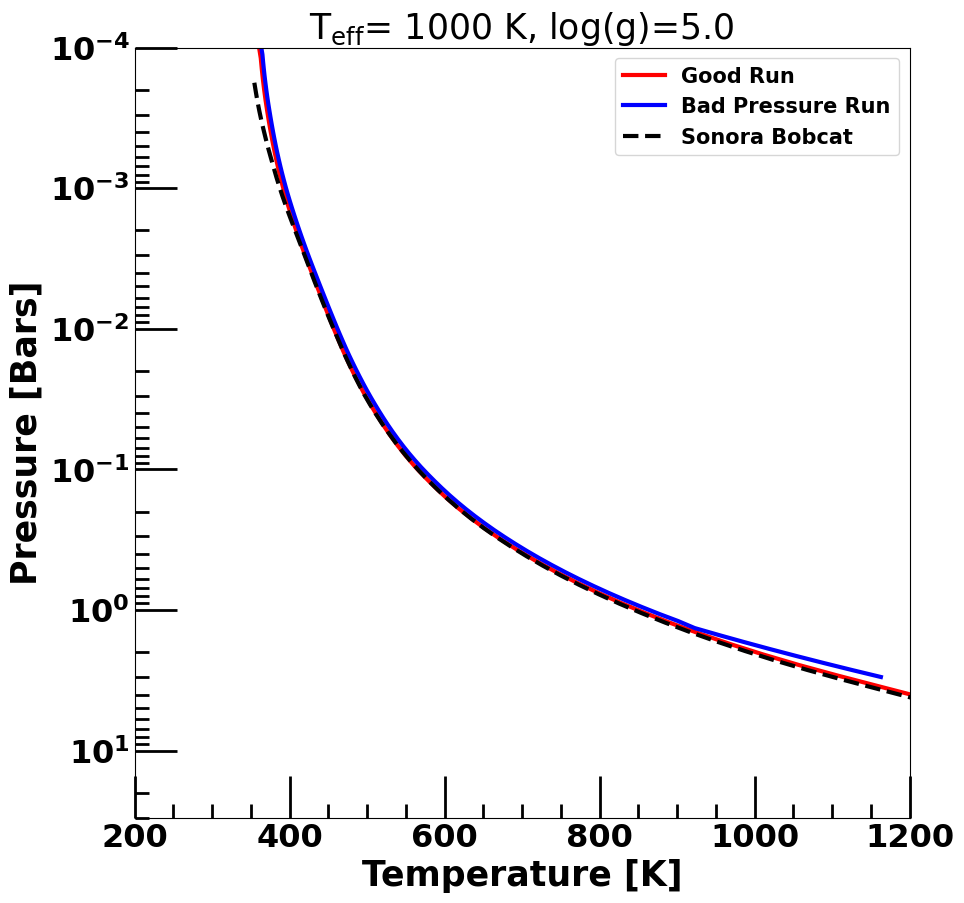

In [16]:
plt.figure(figsize=(10,10))
plt.ylabel("Pressure [Bars]", fontsize=25)
plt.xlabel('Temperature [K]', fontsize=25)
plt.ylim(30,1e-4)
plt.xlim(200,1200)

plt.semilogy(out['temperature'],out['pressure'],color="r",linewidth=3,label="Good Run")
plt.semilogy(out_bad_pres['temperature'],out_bad_pres['pressure'],color="b",linewidth=3,label="Bad Pressure Run")

plt.semilogy(temp_bobcat,pressure_bobcat,color="k",linestyle="--",linewidth=3,label="Sonora Bobcat")


plt.minorticks_on()
plt.tick_params(axis='both',which='major',length =30, width=2,direction='in',labelsize=23)
plt.tick_params(axis='both',which='minor',length =10, width=2,direction='in',labelsize=23)

plt.legend(fontsize=15)

plt.title(r"T$_{\rm eff}$= 1000 K, log(g)=5.0",fontsize=25)



This new profile is slightly off from our run and also the sonora bobcat run. Lets look at its brightness temperature as a function of wavelength and check if it matches well with our previous run.

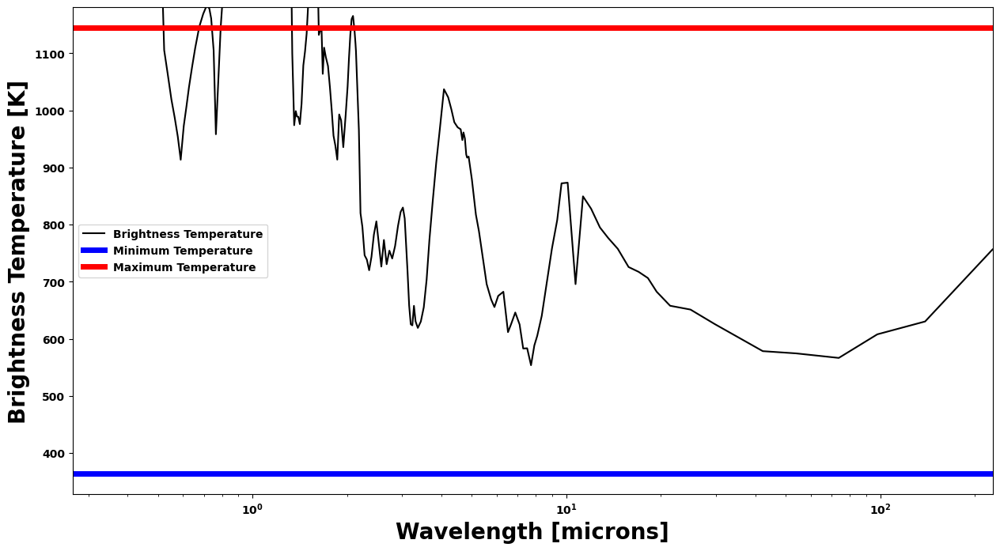

In [17]:
brightness_temp_bad, figure_bad= jpi.brightness_temperature(
    out_bad_pres['spectrum_output'])

See how the brightness temperature from this new run is different from our previous succesful run. The brightness temperatures infact goes over the maximum temperature achieved by the model. Therefore the pressure grid used for this run is incorrect because one can look through the atmosphere to the bottom of the grid at most wavelengths which is not good and the resultant "converged" T(P) profile is also visibly inaccurate as a result as well.

## Post Process High Resolution Spectrum
We can quickly do this by resetting the opannection to not use the ck database and use the `ptchem_df` DataFrame as input for the atmosphere

This is also the point where you could post-process clouds using `virga` or a `box model` as seen in these tutorials here:
1. [Adding clouds with virga](https://natashabatalha.github.io/picaso/notebooks/7_PairingPICASOToVIRGA.html)
2. [Adding box model clouds](https://natashabatalha.github.io/picaso/notebooks/5_AddingTransitSpectrum.html#Adding-Grey-Cloud)

In [18]:
opa_mon = jdi.opannection()

hi_res = jdi.inputs(calculation="browndwarf") # start a calculation
teff= 1000 # Effective Temperature of your Brown Dwarf in K
grav = 1000 # Gravity of your brown dwarf in m/s/s

hi_res.gravity(gravity=grav, gravity_unit=u.Unit('m/(s**2)')) # input gravity

hi_res.atmosphere(df=out['ptchem_df'])
df_spec = hi_res.spectrum(opa_mon, calculation='thermal', full_output=True)
w,f = jdi.mean_regrid(df_spec['wavenumber'],df_spec['thermal'], R=100)

In [19]:
preserve_clima

<xarray.Dataset> Size: 75kB
Dimensions:         (pressure: 91, pressure_layer: 90, wavelength: 196)
Coordinates:
  * pressure        (pressure) float64 728B 0.0001 0.0001187 ... 421.2 500.0
  * pressure_layer  (pressure_layer) float64 720B 0.0001089 0.0001293 ... 458.9
  * wavelength      (wavelength) float64 2kB 227.5 138.8 97.75 ... 0.287 0.2679
Data variables: (12/98)
    temperature     (pressure) float64 728B 360.6 362.8 ... 3.377e+03 3.491e+03
    dtdp            (pressure_layer) float64 720B 0.03481 0.0203 ... 0.1932
    guess 1         (pressure) float64 728B 500.0 500.0 500.0 ... 500.0 500.0
    guess 2         (pressure) float64 728B 500.0 500.0 500.0 ... 679.1 714.5
    guess 3         (pressure) float64 728B 500.0 500.0 500.0 ... 679.1 714.5
    guess 4         (pressure) float64 728B 500.0 500.0 500.0 ... 718.4 755.8
    ...              ...
    Mg+             (pressure) float64 728B 1e-50 1e-50 ... 2.303e-09 4.047e-09
    Si              (pressure) float64 728B 1e-50 1e-50 ... 3.495e-06 4.424e-06
    Fe+             (pressure) float64 728B 1e-50 1e-50 ... 6.177e-10 1.117e-09
    Ti              (pressure) float64 728B 1e-50 1e-50 ... 1.075e-07 1.141e-07
    Ti+             (pressure) float64 728B 1e-50 1e-50 ... 6.988e-11 1.2e-10
    C+              (pressure) float64 728B 1e-50 1e-50 ... 1.875e-19 9.565e-19
Attributes:
    climate_params:  {"cvs_locs": [0, 73, 89, 0, 0, 0], "converged": 1}
    planet_params:   {"effective_temp": 999.8672769938453, "gravity": {"value...

In [20]:
opa_mon = jdi.opannection()
hi_res = jdi.input_xarray(preserve_clima,opa_mon, calculation='browndwarf')
df_spec = hi_res.spectrum(opa_mon, calculation='thermal', full_output=True)

In [21]:
preserve_hires = jdi.output_xarray(df_spec, hi_res)

In [22]:
w,f = jdi.mean_regrid(df_spec['wavenumber'],df_spec['thermal'], R=100)

In [23]:
jpi.show(jpi.spectrum(w,f,x_axis_type='log',y_axis_type='log'))

## `xarray` model storage with post-processed models

In [24]:
preserve_hires = jdi.output_xarray(df_spec, hi_res)

In [25]:
preserve_hires

<xarray.Dataset> Size: 977kB
Dimensions:        (pressure: 91, wavelength: 58681)
Coordinates:
  * pressure       (pressure) float64 728B 0.0001 0.0001187 ... 421.2 500.0
  * wavelength     (wavelength) float64 469kB 15.0 15.0 15.0 ... 0.3 0.3 0.3
Data variables: (12/53)
    temperature    (pressure) float64 728B 360.6 362.8 ... 3.377e+03 3.491e+03
    flux_emission  (wavelength) float64 469kB 2.075e+09 2.037e+09 ... 1.537e+06
    index          (pressure) float64 728B 580.2 582.2 ... 1.546e+03 1.57e+03
    e-             (pressure) float64 728B 1e-50 1e-50 ... 2.251e-07 2.723e-07
    H2             (pressure) float64 728B 0.8321 0.8321 0.8321 ... 0.814 0.8102
    H              (pressure) float64 728B 9.338e-28 1.322e-27 ... 0.02332
    ...             ...
    Mg+            (pressure) float64 728B 1e-50 1e-50 ... 2.303e-09 4.047e-09
    Si             (pressure) float64 728B 1e-50 1e-50 ... 3.495e-06 4.424e-06
    Fe+            (pressure) float64 728B 1e-50 1e-50 ... 6.177e-10 1.117e-09
    Ti             (pressure) float64 728B 1e-50 1e-50 ... 1.075e-07 1.141e-07
    Ti+            (pressure) float64 728B 1e-50 1e-50 ... 6.988e-11 1.2e-10
    C+             (pressure) float64 728B 1e-50 1e-50 ... 1.875e-19 9.565e-19
Attributes:
    planet_params:  {"effective_temp": 1025.220534184242, "gravity": {"value"...